# Deep Layout Parsing

In this tutorial, we will show how to use the `layoutparser` API to 

1. Load Deep Learning Layout Detection models and predict the layout of the input image 
2. Use the coordinate system to parse the output 

The test images are from the [HJDataset](https://dell-research-harvard.github.io/HJDataset/), which contains noisy historical scans with complex layouts. 

In [1]:
import layoutparser as lp
import cv2

## Use Layout Models to detect complex layout 

`layoutparser` can identify the layout of the given document with only 4 lines of code.

In [2]:
image = cv2.imread("data/HJData-test-image.jpg")
image = image[..., ::-1] 
    # Convert the image from BGR (cv2 default loading style)
    # to RGB

In [3]:
model = lp.Detectron2LayoutModel('lp://HJDataset/faster_rcnn_R_50_FPN_3x/config',
                                 extra_config=["TEST.DETECTIONS_PER_IMAGE", "120"])
    # Load the deep layout model from the layoutparser API 
    # For all the supported model, please check the Model 
    # Zoo Page: https://layout-parser.readthedocs.io/en/latest/notes/modelzoo.html

layout = model.detect(image)
    # Detect the layout of the input image

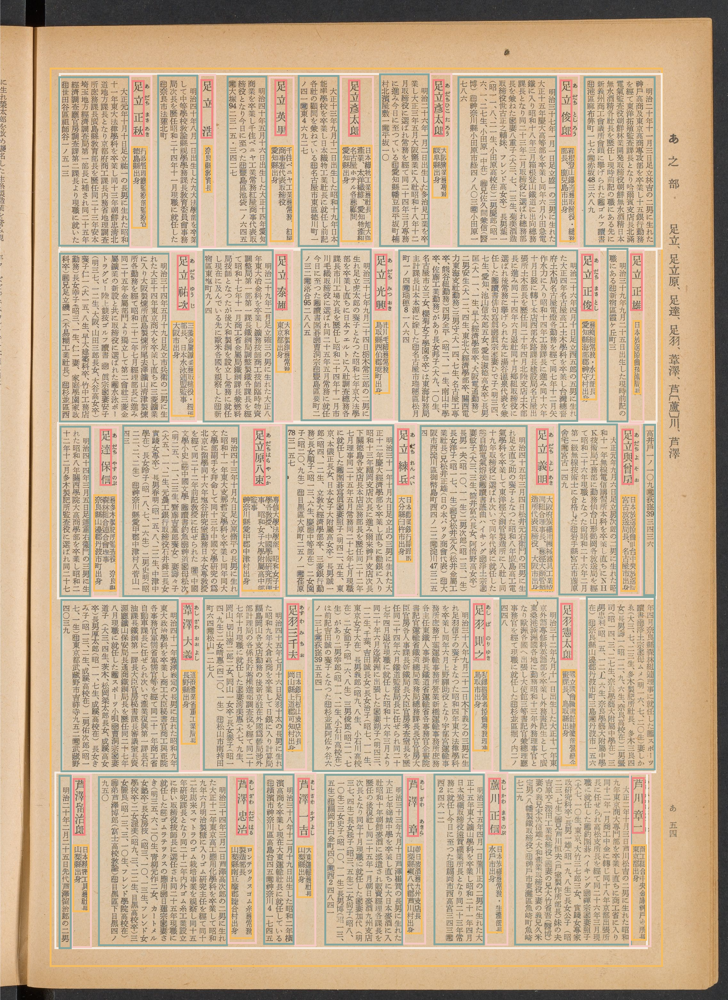

In [4]:
lp.draw_box(image, layout, box_width=6)
    # Show the detected layout of the input image

## Check the results from the model 

In [5]:
type(layout)         

layoutparser.elements.Layout

The `layout` variables is a `Layout` instance, which is inherited from list and supports handy methods for layout processing. 

In [6]:
layout[0]

TextBlock(block=Rectangle(x_1=182.01585388183594, y_1=777.922607421875, x_2=2053.8076171875, y_2=1318.0374755859375), text=, id=None, type=2, parent=None, next=None, score=0.9999566078186035)

`layout` contains a series of `TextBlock`s. They store the coordinates in the `.block` variable and other information of the blocks like block type in `.type`, text in `.text`, etc. More information can be found at the [documentation](https://layout-parser.readthedocs.io/en/latest/api_doc/elements.html#layoutparser.elements.TextBlock). 

## Use the coordinate system to process the detected layout

In [7]:
row_blocks = [b for b in layout if b.type == 2] 
    # 2 is the class for the row boxes 
row_block  = row_blocks[0]
    # Choose the first row block as an example
row_image  = row_block.crop_image(image)
    # Crop out the row image 
row_layout = layout.\
                filter_by(row_block, center=True).\
                relative_to(row_block)
    # In layout, find all the blocks in the row region, 
    # and transform their coordinates into relative 
    # coordinates to the row box

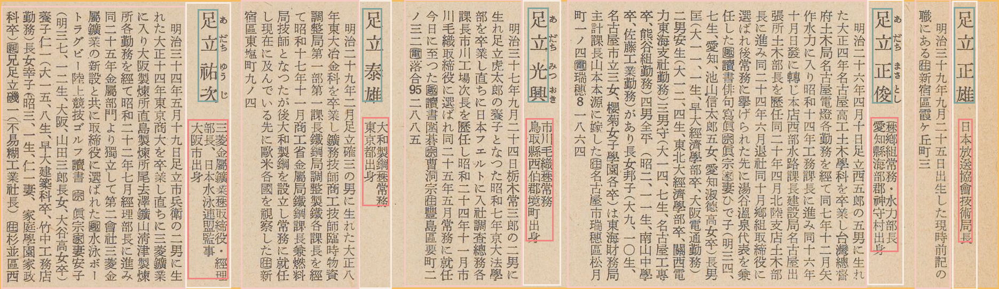

In [8]:
lp.draw_box(row_image, row_layout, box_width=3)